<a href="https://colab.research.google.com/github/ziyuliuzilla/PPP-Removed-Applications/blob/main/PPP_Data_Analysis_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

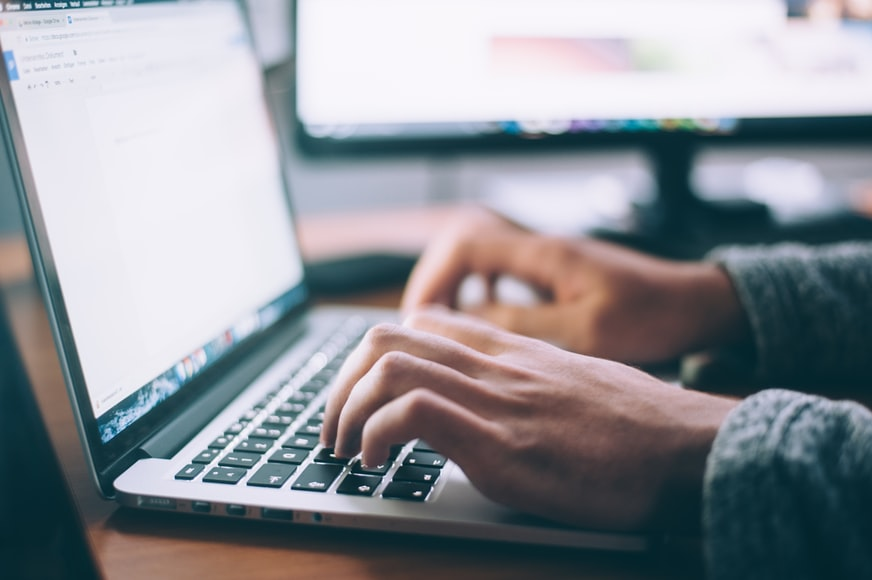

# PPP Removed Applications

Paycheck Protection Program is an SBA-backed loan that helps businesses keep their workforce employed during the COVID-19 crisis. The loans are administered by private lenders, who then submit application information to the SBA.

The main objective of this project is to develop an understanding of why SBA removed certain loan applications. The SBA has not publicly offered a reason for the removal of these applications. We were provided with two datasets with over 500,000 records, including both accepted and removed records. 

This code is for answering the following 3 questions:

*   What are some defining characteristics of the removed loans?

*   How do the characteristics of loans that were removed from the PPP data compare to loans that were not removed from the PPP data?

*   Is it possible to accurately predict whether or not a loan was removed from the data, using fields in the data set and/or additional information you incorporate?  

## 1 Importing and Cleaning Data



*   When cleaning data, seemingly "unreasonable" negative values (such as undisbursed amount), "unanswered" options (such as business age description), etc., are not routinely set as missing values. Because this problem is very special, it aims to explore the reasons why records are removed from the database. We preliminarily assume that, if some questions are not answered, or the staff fills in the wrong answers, etc., the records will be removed.
*   We process the time data, calculate the length of the period between some certain dates(such as loan funded date, loan status update date, and etc), and set it as a new variable.



*   [Data Dictionary](https://docs.google.com/spreadsheets/d/1K2wMsXi6G9qwYHPlhAPI2wvLEXDxzuY5/edit?usp=sharing&ouid=102724875098540516645&rtpof=true&sd=true)



*   [Remaining Records Dataset](https://drive.google.com/file/d/1RLnqREMfPIJqiYcTiFLgo9O9UXXqM7S6/view?usp=sharing)
*   [Removed Records Dataset](https://docs.google.com/spreadsheets/d/1kuNoeiRRRGlxwT3sjEFz0shTqbCb89Yu/edit?usp=sharing&ouid=102724875098540516645&rtpof=true&sd=true)







In [1]:
# import modules

import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as pp

%matplotlib inline

In [2]:
# mount drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# import dataset - applications aprroved full dataset

remain_df = pd.read_csv("/content/drive/MyDrive/IC 2022 - PPP Project/Dataset & Problem/ppp_applicants_ga_full.csv")
remain_df.head()

,name,amount,state,address,city,zip,naics_code,business_type,jobs_retained,date_approved,...,project_county_name,project_state,project_zip,originating_lender_city,originating_lender_state,loan_status_date,originating_lender_location_id,lmi_indicator,forgiveness_amount,forgiveness_date
0,LUMMUS CORPORATION,2000000.0,GA,225 Bourne Blvd,Savannah,31408-9586,333249.0,Corporation,294,2021-02-20,...,CHATHAM,GA,31408-9586,CHICAGO,IL,NaN,116998,N,NaN,NaN
1,COLIANT SOLUTIONS INC.,1294555.0,GA,2703 Brickton North Dr,Buford,30518-9101,541519.0,Corporation,63,2021-01-31,...,GWINNETT,GA,30518-9101,COLUMBUS,GA,NaN,19248,Y,NaN,NaN
2,YOHE PLUMBING INC,729509.0,GA,1120 Franke Court N/A,Augusta,30909,238220.0,Corporation,105,2021-03-12,...,RICHMOND,GA,30909,PHOENIXVILLE,PA,NaN,121536,N,NaN,NaN
3,LEWIS COLOR LITHOGRAPHERS INC,571193.4,GA,30 Joe Kennedy Blvd,Statesboro,30458-3417,323111.0,Corporation,49,2021-02-02,...,BULLOCH,GA,30458-3417,COLUMBUS,GA,NaN,19248,N,NaN,NaN
4,"ALMA PAK INTERNATIONAL, LLC",472700.0,GA,230 PINEVIEW RD,ALMA,31510-4326,445230.0,Partnership,37,2020-04-10,...,BACON,GA,31510-4326,ALMA,GA,2021-01-08,17811,N,475877.59,2020-12-15


In [4]:
# look up column names for remain_df

remain_df.columns

Index(['name', 'amount', 'state', 'address', 'city', 'zip', 'naics_code',
       'business_type', 'jobs_retained', 'date_approved', 'lender',
       'congressional_district', 'loan_number', 'sba_office_code',
       'processing_method', 'loan_status', 'term', 'sba_guaranty_percentage',
       'initial_approval_amount', 'current_approval_amount',
       'undisbursed_amount', 'servicing_lender_location_id',
       'servicing_lender_name', 'servicing_lender_address',
       'servicing_lender_city', 'servicing_lender_state',
       'servicing_lender_zip', 'rural_urban_indicator', 'hubzone_indicator',
       'business_age_description', 'project_city', 'project_county_name',
       'project_state', 'project_zip', 'originating_lender_city',
       'originating_lender_state', 'loan_status_date',
       'originating_lender_location_id', 'lmi_indicator', 'forgiveness_amount',
       'forgiveness_date'],
      dtype='object')

In [5]:
# import dataset - applications have been removed

remove_df = pd.read_excel("/content/drive/MyDrive/IC 2022 - PPP Project/Dataset & Problem/ppp-removed-ga.xlsx")
remove_df.head()

,name,amount,state,address,city,zip,naics_code,business_type,jobs_retained,date_approved,...,project_county_name,project_state,project_zip,originating_lender_city,originating_lender_state,loan_status_date,originating_lender_location_id,lmi_indicator,forgiveness_amount,forgiveness_date
0,TRIPLE C CUSTOM CONCRETE LLC,43655.0,GA,106 Lisa Street East Dublin GA,East Dublin,31027.0,238990.0,Limited Liability Company(LLC),7.0,2021-05-11,...,LAURENS,GA,31027.0,Saint Petersburg,FL,2021-05-11,123499.0,Y,NaN,NaN
1,DAVIS LAWN CARE SERVICES,35000.0,GA,752 Savannah Ave N/A,Waynesboro,30830-1156,112910.0,Partnership,2.0,2021-05-12,...,BURKE,GA,30830-1156,ARLINGTON,MA,2021-05-12,262380.0,N,NaN,NaN
2,LONNIE RATLIFF,28949.0,GA,55 Maple St NW Apt 802,Atlanta,30314-4760,531390.0,Single Member LLC,5.0,2021-04-16,...,FULTON,GA,30314-4760,PHOENIXVILLE,PA,2021-04-16,121536.0,Y,NaN,NaN
3,DENARD TRIMBLE,20833.0,GA,727 Chapman St,Jonesboro,30238-5681,812111.0,Sole Proprietorship,1.0,2021-05-22,...,FAYETTE,GA,30238-5681,Brea,CA,2021-05-22,514546.0,Y,NaN,NaN
4,DANA VINES,20833.0,GA,3548 Tracey Dr,Duluth,30096-3861,311999.0,Sole Proprietorship,1.0,2021-03-20,...,GWINNETT,GA,30096-3861,Miami,FL,2021-03-20,529192.0,N,NaN,NaN


In [6]:
# look up column names for remove_df

remove_df.columns

Index(['name', 'amount', 'state', 'address', 'city', 'zip', 'naics_code',
       'business_type', 'jobs_retained', 'date_approved', 'lender',
       'congressional_district', 'loan_number', 'sba_office_code',
       'processing_method', 'loan_status', 'term', 'sba_guaranty_percentage',
       'initial_approval_amount', 'current_approval_amount',
       'undisbursed_amount', 'servicing_lender_location_id',
       'servicing_lender_name', 'servicing_lender_address',
       'servicing_lender_city', 'servicing_lender_state',
       'servicing_lender_zip', 'rural_urban_indicator', 'hubzone_indicator',
       'business_age_description', 'project_city', 'project_county_name',
       'project_state', 'project_zip', 'originating_lender_city',
       'originating_lender_state', 'loan_status_date',
       'originating_lender_location_id', 'lmi_indicator', 'forgiveness_amount',
       'forgiveness_date'],
      dtype='object')

In [7]:
# verify whether 2 dataset overlap

overlap = [x for x in remain_df.loan_number if x in remove_df.loan_number]
print("overlap:", overlap)

# these 2 dataset do not overlap each other

overlap: []


In [8]:
# process & clean data for remain_df

# slice string and save 5 digit zip code as new columns
remain_df["zip_5dig"]=(remain_df["zip"].astype("string").str[:5])

remain_df["servlender_zip_5dig"]=(remain_df["servicing_lender_zip"].astype("string").str[:5])
if len(remain_df["servlender_zip_5dig"]) < 5:
  remain_df["servlender_zip_5dig"] = remain_df["servlender_zip_5dig"].zfill(1)

remain_df["project_zip_5dig"]=(remain_df["project_zip"].astype("string").str[:5])

# do not set missing value for seemingly "unreasonable" negative value for amount
# for record is removed might because of an error

# convert date into datetime type
remain_df["loan_status_date"] = pd.to_datetime(remain_df["loan_status_date"])
remain_df["date_approved"] = pd.to_datetime(remain_df["date_approved"])
remain_df["forgiveness_date"] = pd.to_datetime(remain_df["forgiveness_date"])

# create new variables "period_1", "period_2", "status_gen_cycle"
# period_1 = Forgiveness_Date -  Date_Approved
remain_df["period_1"] = (remain_df["forgiveness_date"] - remain_df["date_approved"]).dt.days
# period 2 = Loan_Status_Date - Forgiveness_Date
remain_df["period_2"] = (remain_df["loan_status_date"] - remain_df["forgiveness_date"]).dt.days
# status_gen_cycle = Loan_Status_Date - Date_Approved
remain_df["status_gen_cycle"] = (remain_df["loan_status_date"] - remain_df["date_approved"]).dt.days

# create a new dummy variable "is_removed"
remain_df["is_removed"] = 0

# read the dataframe again
remain_df

,name,amount,state,address,city,zip,naics_code,business_type,jobs_retained,date_approved,...,lmi_indicator,forgiveness_amount,forgiveness_date,zip_5dig,servlender_zip_5dig,project_zip_5dig,period_1,period_2,status_gen_cycle,is_removed
0,LUMMUS CORPORATION,2000000.00,GA,225 Bourne Blvd,Savannah,31408-9586,333249.0,Corporation,294,2021-02-20,...,N,NaN,NaT,31408,60603,31408,NaN,NaN,NaN,0
1,COLIANT SOLUTIONS INC.,1294555.00,GA,2703 Brickton North Dr,Buford,30518-9101,541519.0,Corporation,63,2021-01-31,...,Y,NaN,NaT,30518,31901,30518,NaN,NaN,NaN,0
2,YOHE PLUMBING INC,729509.00,GA,1120 Franke Court N/A,Augusta,30909,238220.0,Corporation,105,2021-03-12,...,N,NaN,NaT,30909,19460,30909,NaN,NaN,NaN,0
3,LEWIS COLOR LITHOGRAPHERS INC,571193.40,GA,30 Joe Kennedy Blvd,Statesboro,30458-3417,323111.0,Corporation,49,2021-02-02,...,N,NaN,NaT,30458,31901,30458,NaN,NaN,NaN,0
4,"ALMA PAK INTERNATIONAL, LLC",472700.00,GA,230 PINEVIEW RD,ALMA,31510-4326,445230.0,Partnership,37,2020-04-10,...,N,475877.59,2020-12-15,31510,31510,31510,249.0,24.0,273.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
553823,PAUL CLARK,757.00,GA,609 Fern St,Waycross,31501-3210,561492.0,Independent Contractors,1,2021-04-30,...,N,NaN,NaT,31501,33173,31501,NaN,NaN,NaN,0
553824,DEWEY GRIFFIN,700.00,GA,245 Moray Rd,Alma,31510-4371,111940.0,Sole Proprietorship,1,2021-04-02,...,N,702.61,2021-08-23,31510,31510,31510,143.0,32.0,175.0,0
553825,HAYDEN WHITLOW,582.71,GA,2696 Douglas Ct NW,Acworth,30101-3677,561730.0,Independent Contractors,1,2021-02-19,...,N,NaN,NaT,30101,73047,30101,NaN,NaN,NaN,0
553826,KEVIN LEWIS,270.00,GA,4830 Northway Drive Northeast,Sandy Springs,30342-2424,541990.0,Sole Proprietorship,1,2020-08-03,...,N,NaN,NaT,30342,07666,30342,NaN,NaN,NaN,0


In [9]:
# process & clean data for remove_df

# slice string and save 5 digit zip code as new columns
remove_df ["zip_5dig"] = (remove_df["zip"].astype("string").str[:5])

remove_df["servlender_zip_5dig"] = (remove_df["servicing_lender_zip"].astype("string").str[:5])
if len(remove_df["servlender_zip_5dig"]) < 5:
  remove_df["servlender_zip_5dig"] = remove_df["servlender_zip_5dig"].zfill(1)


remove_df["project_zip_5dig"] = (remove_df["project_zip"].astype("string").str[:5])

# do not set missing value for seemingly "unreasonable" negative value for amount
# for record is removed might because of an error

# convert date into datetime type
remove_df["loan_status_date"] = pd.to_datetime(remove_df["loan_status_date"])
remove_df["date_approved"] = pd.to_datetime(remove_df["date_approved"])
remove_df["forgiveness_date"] = pd.to_datetime(remove_df["forgiveness_date"])

# create new variables "period_1", "period_2", "status_gen_cycle"
# period_1 = Forgiveness_Date -  Date_Approved
remove_df["period_1"] = (remove_df["forgiveness_date"] - remove_df["date_approved"]).dt.days
# period 2 = Loan_Status_Date - Forgiveness_Date
remove_df["period_2"] = (remove_df["loan_status_date"] - remove_df["forgiveness_date"]).dt.days
# status_gen_cycle = Loan_Status_Date - Date_Approved
remove_df["status_gen_cycle"] = (remove_df["loan_status_date"] - remove_df["date_approved"]).dt.days

# create a new dummy variable is_removed
remove_df["is_removed"] = 1

# read the dataframe again
remove_df

,name,amount,state,address,city,zip,naics_code,business_type,jobs_retained,date_approved,...,lmi_indicator,forgiveness_amount,forgiveness_date,zip_5dig,servlender_zip_5dig,project_zip_5dig,period_1,period_2,status_gen_cycle,is_removed
0,TRIPLE C CUSTOM CONCRETE LLC,43655.0,GA,106 Lisa Street East Dublin GA,East Dublin,31027.0,238990.0,Limited Liability Company(LLC),7.0,2021-05-11,...,Y,NaN,NaT,31027,33701,31027,NaN,NaN,0.0,1
1,DAVIS LAWN CARE SERVICES,35000.0,GA,752 Savannah Ave N/A,Waynesboro,30830-1156,112910.0,Partnership,2.0,2021-05-12,...,N,NaN,NaT,30830,02474,30830,NaN,NaN,0.0,1
2,LONNIE RATLIFF,28949.0,GA,55 Maple St NW Apt 802,Atlanta,30314-4760,531390.0,Single Member LLC,5.0,2021-04-16,...,Y,NaN,NaT,30314,19460,30314,NaN,NaN,0.0,1
3,DENARD TRIMBLE,20833.0,GA,727 Chapman St,Jonesboro,30238-5681,812111.0,Sole Proprietorship,1.0,2021-05-22,...,Y,NaN,NaT,30238,92653,30238,NaN,NaN,0.0,1
4,DANA VINES,20833.0,GA,3548 Tracey Dr,Duluth,30096-3861,311999.0,Sole Proprietorship,1.0,2021-03-20,...,N,NaN,NaT,30096,33173,30096,NaN,NaN,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25831,DONNELL WILSON,1950.0,GA,1000 Paces Ln,Woodstock,30189-4829,621511.0,Sole Proprietorship,1.0,2021-04-01,...,N,NaN,NaT,30189,92653,30189,NaN,NaN,0.0,1
25832,MAMADOU DIOULDE DIALLO,1849.0,GA,7000 Roswell Rd Apt 252,Atlanta,30328-2389,485310.0,Independent Contractors,1.0,2021-05-21,...,N,NaN,NaT,30328,76021,30328,NaN,NaN,0.0,1
25833,ANTHONY HARRIS,1245.0,GA,2849 Blount St,Atlanta,30344-3732,485310.0,Independent Contractors,1.0,2021-04-08,...,Y,NaN,NaT,30344,76021,30344,NaN,NaN,0.0,1
25834,TAAHIRA ROBINSON,1075.0,GA,8541 Glendevon Ct,Riverdale,30274-4573,561110.0,Limited Liability Company(LLC),1.0,2021-05-11,...,Y,NaN,NaT,30274,33173,30274,NaN,NaN,0.0,1


In [10]:
# joint 2 dataset

frames = [remove_df, remain_df]
full_df = pd.concat(frames)
full_df.columns

Index(['name', 'amount', 'state', 'address', 'city', 'zip', 'naics_code',
       'business_type', 'jobs_retained', 'date_approved', 'lender',
       'congressional_district', 'loan_number', 'sba_office_code',
       'processing_method', 'loan_status', 'term', 'sba_guaranty_percentage',
       'initial_approval_amount', 'current_approval_amount',
       'undisbursed_amount', 'servicing_lender_location_id',
       'servicing_lender_name', 'servicing_lender_address',
       'servicing_lender_city', 'servicing_lender_state',
       'servicing_lender_zip', 'rural_urban_indicator', 'hubzone_indicator',
       'business_age_description', 'project_city', 'project_county_name',
       'project_state', 'project_zip', 'originating_lender_city',
       'originating_lender_state', 'loan_status_date',
       'originating_lender_location_id', 'lmi_indicator', 'forgiveness_amount',
       'forgiveness_date', 'zip_5dig', 'servlender_zip_5dig',
       'project_zip_5dig', 'period_1', 'period_2', 'status_

In [12]:
# create a new datafram "target_df" and include dependent variable and independent variables

# dependent variable: 'is_removed'

# primary key constraints: 'loan_number', 'originating_lender_location_id'

# potential independent variables: 
# 'amount', 'state', 'naics_code', 'business_type', 'jobs_retained',
# 'congressional_district', 'sba_office_code', 'processing_method', 'loan_status', 'term',
# 'initial_approval_amount', 'current_approval_amount', 'undisbursed_amount',
# 'servicing_lender_state', 'rural_urban_indicator', 'hubzone_indicator', 'business_age_description'
# 'project_state', 'originating_lender_state', 'lmi_indicator', 'forgiveness_amount',
# 'zip_5dig', 'servlender_zip_5dig', 'project_zip_5dig', 'period_1', 'period_2', 'status_gen_cycle',


# view trends over time: 'date_approved', 'forgiveness_date', 'loan_status_date'

target_df = full_df[['is_removed',
                    'loan_number', 'originating_lender_location_id',
                    'amount', 'state', 'naics_code', 'business_type', 'jobs_retained',
                    'congressional_district', 'sba_office_code', 'processing_method', 'loan_status', 'term',
                    'initial_approval_amount', 'current_approval_amount', 'undisbursed_amount',
                    'servicing_lender_state', 'rural_urban_indicator', 'hubzone_indicator', 'business_age_description',
                    'project_state', 'originating_lender_state', 'lmi_indicator', 'forgiveness_amount',
                    'zip_5dig', 'servlender_zip_5dig', 'project_zip_5dig', 'period_1', 'period_2', 'status_gen_cycle',
                    'date_approved', 'forgiveness_date', 'loan_status_date']]
target_df

,is_removed,loan_number,originating_lender_location_id,amount,state,naics_code,business_type,jobs_retained,congressional_district,sba_office_code,...,forgiveness_amount,zip_5dig,servlender_zip_5dig,project_zip_5dig,period_1,period_2,status_gen_cycle,date_approved,forgiveness_date,loan_status_date
0,1,8.165379e+09,123499.0,43655.00,GA,238990.0,Limited Liability Company(LLC),7.0,GA-12,405.0,...,NaN,31027,33701,31027,NaN,NaN,0.0,2021-05-11,NaT,2021-05-11
1,1,9.923749e+09,262380.0,35000.00,GA,112910.0,Partnership,2.0,GA-12,405.0,...,NaN,30830,02474,30830,NaN,NaN,0.0,2021-05-12,NaT,2021-05-12
2,1,4.930589e+09,121536.0,28949.00,GA,531390.0,Single Member LLC,5.0,GA-05,405.0,...,NaN,30314,19460,30314,NaN,NaN,0.0,2021-04-16,NaT,2021-04-16
3,1,6.096229e+09,514546.0,20833.00,GA,812111.0,Sole Proprietorship,1.0,GA-13,405.0,...,NaN,30238,92653,30238,NaN,NaN,0.0,2021-05-22,NaT,2021-05-22
4,1,6.118639e+09,529192.0,20833.00,GA,311999.0,Sole Proprietorship,1.0,GA-07,405.0,...,NaN,30096,33173,30096,NaN,NaN,0.0,2021-03-20,NaT,2021-03-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
553823,0,5.834209e+09,529192.0,757.00,GA,561492.0,Independent Contractors,1.0,GA-01,405.0,...,NaN,31501,33173,31501,NaN,NaN,NaN,2021-04-30,NaT,NaT
553824,0,5.233839e+09,17808.0,700.00,GA,111940.0,Sole Proprietorship,1.0,GA-01,405.0,...,702.61,31510,31510,31510,143.0,32.0,175.0,2021-04-02,2021-08-23,2021-09-24
553825,0,1.895599e+09,58771.0,582.71,GA,561730.0,Independent Contractors,1.0,GA-11,405.0,...,NaN,30101,73047,30101,NaN,NaN,NaN,2021-02-19,NaT,NaT
553826,0,3.063468e+09,456756.0,270.00,GA,541990.0,Sole Proprietorship,1.0,GA-06,405.0,...,NaN,30342,07666,30342,NaN,NaN,NaN,2020-08-03,NaT,NaT


In [13]:
# recode hubzone_indicator
target_df["hubzone"] = np.where(target_df["hubzone_indicator"]=="Y",1,0)

# recode rural_urban_indicator
target_df["rural"] = np.where(target_df["rural_urban_indicator"]=="R",1,0)
target_df["urban"] = np.where(target_df["rural_urban_indicator"]=="U",1,0)

# recode lmi_indicator
target_df["lmi"] = np.where(target_df["lmi_indicator"]=="Y",1,0)

# convert amount into log format
target_df["amount_lg"]= np.log(target_df["amount"])
target_df["initial_lg"]= np.log(target_df["initial_approval_amount"])
target_df["current_lg"]= np.log(target_df["current_approval_amount"])
target_df["undisbursed_lg"]= np.log(target_df["undisbursed_amount"])
target_df["forgiveness_lg"]= np.log(target_df["forgiveness_amount"])


target_df.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-doc

,is_removed,loan_number,originating_lender_location_id,amount,state,naics_code,business_type,jobs_retained,congressional_district,sba_office_code,...,loan_status_date,hubzone,rural,urban,lmi,amount_lg,initial_lg,current_lg,undisbursed_lg,forgiveness_lg
0,1,8.165379e+09,123499.0,43655.0,GA,238990.0,Limited Liability Company(LLC),7.0,GA-12,405.0,...,2021-05-11,0,1,0,1,10.684073,10.684073,10.684073,10.684073,NaN
1,1,9.923749e+09,262380.0,35000.0,GA,112910.0,Partnership,2.0,GA-12,405.0,...,2021-05-12,1,1,0,0,10.463103,10.463103,10.463103,10.463103,NaN
2,1,4.930589e+09,121536.0,28949.0,GA,531390.0,Single Member LLC,5.0,GA-05,405.0,...,2021-04-16,1,0,1,1,10.273291,10.273291,10.273291,10.273291,NaN
3,1,6.096229e+09,514546.0,20833.0,GA,812111.0,Sole Proprietorship,1.0,GA-13,405.0,...,2021-05-22,0,0,1,1,9.944294,9.944294,9.944294,9.944294,NaN
4,1,6.118639e+09,529192.0,20833.0,GA,311999.0,Sole Proprietorship,1.0,GA-07,405.0,...,2021-03-20,0,0,1,0,9.944294,9.944294,9.944294,9.944294,NaN


In [14]:
# drop repeated columns and repeated primary key constraints

final_df = target_df.drop(["hubzone_indicator","rural_urban_indicator","lmi_indicator"],axis=1)

final_df.drop_duplicates (inplace = True)
final_df.drop_duplicates (["loan_number"], inplace = True, keep="first")

final_df.head()

,is_removed,loan_number,originating_lender_location_id,amount,state,naics_code,business_type,jobs_retained,congressional_district,sba_office_code,...,loan_status_date,hubzone,rural,urban,lmi,amount_lg,initial_lg,current_lg,undisbursed_lg,forgiveness_lg
0,1,8.165379e+09,123499.0,43655.0,GA,238990.0,Limited Liability Company(LLC),7.0,GA-12,405.0,...,2021-05-11,0,1,0,1,10.684073,10.684073,10.684073,10.684073,NaN
1,1,9.923749e+09,262380.0,35000.0,GA,112910.0,Partnership,2.0,GA-12,405.0,...,2021-05-12,1,1,0,0,10.463103,10.463103,10.463103,10.463103,NaN
2,1,4.930589e+09,121536.0,28949.0,GA,531390.0,Single Member LLC,5.0,GA-05,405.0,...,2021-04-16,1,0,1,1,10.273291,10.273291,10.273291,10.273291,NaN
3,1,6.096229e+09,514546.0,20833.0,GA,812111.0,Sole Proprietorship,1.0,GA-13,405.0,...,2021-05-22,0,0,1,1,9.944294,9.944294,9.944294,9.944294,NaN
4,1,6.118639e+09,529192.0,20833.0,GA,311999.0,Sole Proprietorship,1.0,GA-07,405.0,...,2021-03-20,0,0,1,0,9.944294,9.944294,9.944294,9.944294,NaN


In [15]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 579664 entries, 0 to 553827
Data columns (total 39 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   is_removed                      579664 non-null  int64         
 1   loan_number                     579664 non-null  float64       
 2   originating_lender_location_id  579664 non-null  float64       
 3   amount                          579664 non-null  float64       
 4   state                           579664 non-null  object        
 5   naics_code                      577324 non-null  float64       
 6   business_type                   579623 non-null  object        
 7   jobs_retained                   579664 non-null  float64       
 8   congressional_district          579659 non-null  object        
 9   sba_office_code                 579664 non-null  float64       
 10  processing_method               579664 non-null  object 

In [ ]:
# export clean data

final_df.to_csv('clean_data.csv')

## 2 Visualizing and Describing Data


*   Based on gut feeling, we propose hypothesis that location of stakeholders, rural or urban, business age of small business, size of small company, risk assessments, reputation of borrower and other factors will affect whether a certain loan record will be removed or not.
*   Choose Visualization to get a comprehensive sense of the entire dataset in a direct way.



In [ ]:
# import packages

import scipy.stats

from IPython import display
from ipywidgets import interact, widgets

### 2.1 Summary Statistics Comparison 


*   Compare the difference in characteristics of removed records and that of remaining data.
*   Based on summary statistics and boxplot.



In [16]:
# create dataset for summary statistics comparison

remove = final_df [final_df.is_removed == 1]

remain = final_df [final_df.is_removed == 0]

remove_ds = remove[["is_removed","hubzone","rural","urban","lmi",
                    "period_1","period_2","status_gen_cycle",
                    "amount","term","jobs_retained","initial_approval_amount",
                    "current_approval_amount","undisbursed_amount","forgiveness_amount"]]

remain_ds = remain[["is_removed","hubzone","rural","urban","lmi",
                    "period_1","period_2","status_gen_cycle",
                    "amount","term","jobs_retained","initial_approval_amount",
                    "current_approval_amount","undisbursed_amount","forgiveness_amount"]]
remove_ds

,is_removed,hubzone,rural,urban,lmi,period_1,period_2,status_gen_cycle,amount,term,jobs_retained,initial_approval_amount,current_approval_amount,undisbursed_amount,forgiveness_amount
0,1,0,1,0,1,NaN,NaN,0.0,43655.0,60.0,7.0,43655.0,43655.0,43655.0,NaN
1,1,1,1,0,0,NaN,NaN,0.0,35000.0,60.0,2.0,35000.0,35000.0,35000.0,NaN
2,1,1,0,1,1,NaN,NaN,0.0,28949.0,60.0,5.0,28949.0,28949.0,28949.0,NaN
3,1,0,0,1,1,NaN,NaN,0.0,20833.0,60.0,1.0,20833.0,20833.0,20833.0,NaN
4,1,0,0,1,0,NaN,NaN,0.0,20833.0,60.0,1.0,20833.0,20833.0,20833.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25831,1,0,0,1,0,NaN,NaN,0.0,1950.0,60.0,1.0,1950.0,1950.0,1950.0,NaN
25832,1,0,0,1,0,NaN,NaN,0.0,1849.0,60.0,1.0,1849.0,1849.0,1849.0,NaN
25833,1,1,0,1,1,NaN,NaN,0.0,1245.0,60.0,1.0,1245.0,1245.0,1245.0,NaN
25834,1,0,0,1,1,NaN,NaN,0.0,1075.0,60.0,1.0,1075.0,1075.0,1075.0,NaN


In [ ]:
# summary statistics for remove_ds 

remove_ds.describe()

In [ ]:
# summry statistics for remain_ds

remain_ds.describe()

In [ ]:
# compare boxplot for amount_lg

pd.DataFrame({"remove":remove.amount_lg,"remain":remain.amount_lg}).boxplot()

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


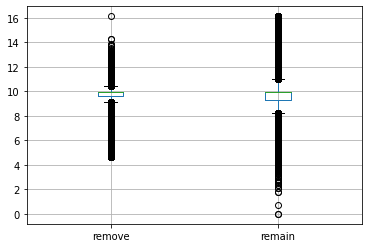

In [ ]:
# compare boxplot for initial_lg

pd.DataFrame({"remove":remove.initial_lg,"remain":remain.initial_lg}).boxplot()

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


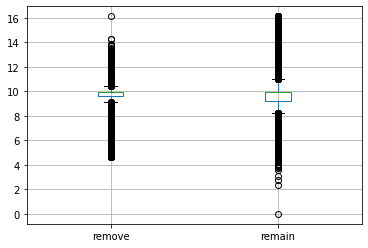

In [ ]:
# # compare boxplot for current_lg

pd.DataFrame({"remove":remove.current_lg,"remain":remain.current_lg}).boxplot()

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
/usr/local/lib/python3.7/dist-packages/numpy/lib/function_base.py:4009: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


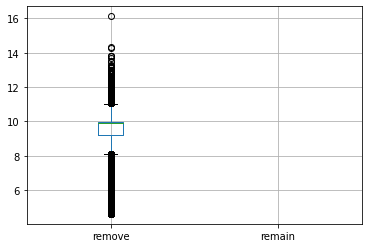

In [ ]:
# compare boxplot for undisbursed_lg

pd.DataFrame({"remove":remove.undisbursed_lg,"remain":remain.undisbursed_lg}).boxplot()

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


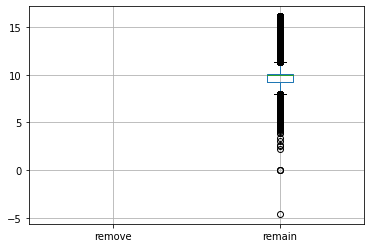

In [ ]:
# compare boxplot for forgiveness_lg

pd.DataFrame({"remove":remove.forgiveness_lg,"remain":remain.forgiveness_lg}).boxplot()

In [ ]:
pd.DataFrame({"remove":remove.jobs_retained,"remain":remain.jobs_retained}).boxplot()

In [ ]:
pd.DataFrame({"remove":remove.term,"remain":remain.term}).boxplot()

In [ ]:
pd.DataFrame({"remove":remove.status_gen_cycle,"remain":remain.status_gen_cycle}).boxplot()

### 2.2 Correlation Visualization

*   Create heat map to see the correlation among variables. 



In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

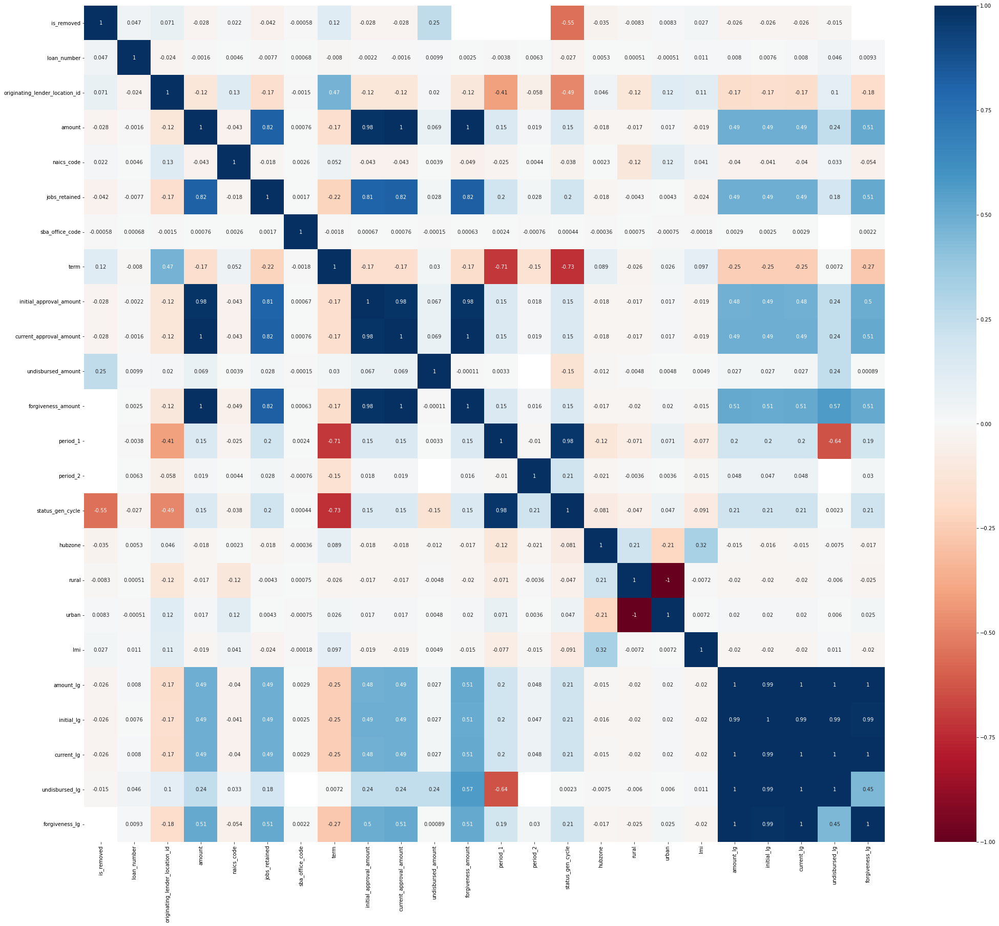

In [ ]:
plt.figure(figsize=(35,30))
sns.heatmap(final_df.corr(),cbar=True,annot=True,cmap='RdBu')



*   from this heat map, we could see period_1, period_2, and forgiveness_amount are not valid for dependent variable is_removed
*   no longer consider these 3 variables thereafter



In [ ]:
# drop these 3 variables thereafter

# also we drop state since all comes from GA
final_df = final_df.drop(["period_1","period_2","forgiveness_lg","state",
                          "amount","initial_approval_amount",
                          "current_approval_amount","undisbursed_amount","forgiveness_amount"
                          ],
                    axis=1)

In [ ]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 579664 entries, 0 to 553827
Data columns (total 30 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   is_removed                      579664 non-null  int64         
 1   loan_number                     579664 non-null  float64       
 2   originating_lender_location_id  579664 non-null  float64       
 3   naics_code                      577324 non-null  float64       
 4   business_type                   579623 non-null  object        
 5   jobs_retained                   579664 non-null  float64       
 6   congressional_district          579659 non-null  object        
 7   sba_office_code                 579664 non-null  float64       
 8   processing_method               579664 non-null  object        
 9   loan_status                     579664 non-null  object        
 10  term                            579664 non-null  float64

### 2.3 Time Trends





*   We roughly assume that the frequency with which data is shifted out is related to time. For example, a large amount of data is removed in a certain period of time, or as time goes by, more and more data will be removed.
*   For a better visualization, see the remove trends over time via Tableau more distinctively.



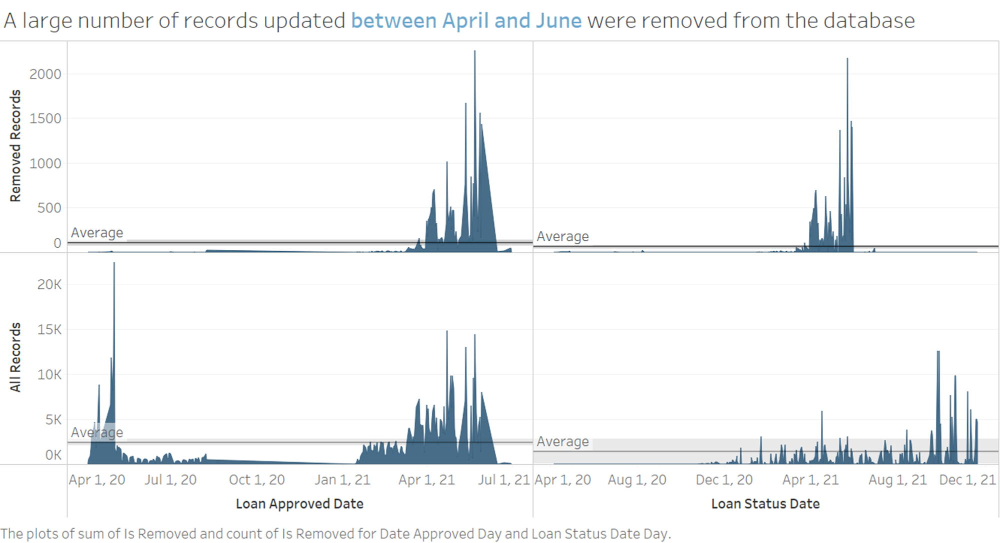

## 3 Statistical Inference


*   Then turn from intuition to science, and use statistical tests to verify whether our assumptions based on gut feeling are correct.
*   Focus on testing the relationship between potential independent variables and dependent variables, and pay attention to whether there is interaction between independent variables.



### 3.1 Exploratory Data Analysis


In [ ]:
!pip install pycaret
#from pycaret.utils import enable_colab
#enable_colab()
from pycaret.regression import *

eda_data = final_df.drop(['loan_number', 'originating_lender_location_id','date_approved',
'forgiveness_date','loan_status_date','zip_5dig','servlender_zip_5dig','project_zip_5dig'], axis=1) 

eda_data = eda_data.reset_index(drop=True)

pc_eda = setup(data = eda_data, target = 'is_removed', session_id=123 , profile=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
# create a dataset for both statistical inference and statistical modeling

blr = final_df.drop(["loan_number","originating_lender_location_id","state",
                     "zip_5dig","servlender_zip_5dig","project_zip_5dig",
                     "amount","initial_approval_amount","current_approval_amount",
                      "forgiveness_amount",
                     "date_approved","forgiveness_date","loan_status_date",
                     "period_1","period_2","forgiveness_lg"],
                    axis=1)
blr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 579664 entries, 0 to 553827
Data columns (total 23 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   is_removed                579664 non-null  int64  
 1   naics_code                577324 non-null  float64
 2   business_type             579623 non-null  object 
 3   jobs_retained             579664 non-null  float64
 4   congressional_district    579659 non-null  object 
 5   sba_office_code           579664 non-null  float64
 6   processing_method         579664 non-null  object 
 7   loan_status               579664 non-null  object 
 8   term                      579664 non-null  float64
 9   undisbursed_amount        579548 non-null  float64
 10  servicing_lender_state    579664 non-null  object 
 11  business_age_description  579664 non-null  object 
 12  project_state             579664 non-null  object 
 13  originating_lender_state  579664 non-null  o

In [19]:
# change some variables into categorical

blr["naics_code"]=blr["naics_code"].astype("category")
blr["business_type"]=blr["business_type"].astype("category")
blr["congressional_district"]=blr["congressional_district"].astype("category")
blr["sba_office_code"]=blr["sba_office_code"].astype("category")
blr["processing_method"]=blr["processing_method"].astype("category")
blr["loan_status"]=blr["loan_status"].astype("category")
blr["servicing_lender_state"]=blr["servicing_lender_state"].astype("category")
blr["business_age_description"]=blr["business_age_description"].astype("category")
blr["originating_lender_state"]=blr["originating_lender_state"].astype("category")
blr["project_state"]=blr["project_state"].astype("category")

blr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 579664 entries, 0 to 553827
Data columns (total 23 columns):
 #   Column                    Non-Null Count   Dtype   
---  ------                    --------------   -----   
 0   is_removed                579664 non-null  int64   
 1   naics_code                577324 non-null  category
 2   business_type             579623 non-null  category
 3   jobs_retained             579664 non-null  float64 
 4   congressional_district    579659 non-null  category
 5   sba_office_code           579664 non-null  category
 6   processing_method         579664 non-null  category
 7   loan_status               579664 non-null  category
 8   term                      579664 non-null  float64 
 9   undisbursed_amount        579548 non-null  float64 
 10  servicing_lender_state    579664 non-null  category
 11  business_age_description  579664 non-null  category
 12  project_state             579664 non-null  category
 13  originating_lender_state  579

### 3.2 Inference results



*   [is_removed] only has a high correlation with [loan_status] and [status_gen_cycle]. 
But [status_gen_cycle] is created by calculating the 

*   length between loan funded date and loan status update date, so actually they’re highly correlated to each other.

*   The results of verifying the hypothesis exceeded our expectations and overturned our gut feeling. It means the only determinant of whether a loan record is removed or not is loan status and loan status generation cycle. 



*   [Loan_status] has a high correlation with [business_type], [term], [serve_state], and [originating_lender_state].
*   The loan status is correlative to business type, loan maturity, and the location of lender.
[status_gen_cycle] has a high correlation with [job_retained], [term], [business_type], [servicing_lender_state], and [[originating_lender_state].


*   The length of loan status generation cycle is correlative to company size, loan maturity, business type, and location of lender.












## 4 Statistical Modeling




*   Choose a binary logistic regression model for statistical modeling to interpret the determinants of whether a loan was removed from the database.



### 4.1 Build the Model

In [20]:
# create binary logistic regression using logit function


import statsmodels.formula.api as smf

blrmodel = smf.logit(formula="is_removed~status_gen_cycle+jobs_retained+hubzone+urban",data=blr).fit()
blrmodel.summary()

# status_gen_cycle is the key determinant

Optimization terminated successfully.
         Current function value: 0.005889
         Iterations 18


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:             is_removed   No. Observations:               303920
Model:                          Logit   Df Residuals:                   303915
Method:                           MLE   Df Model:                            4
Date:                Fri, 04 Mar 2022   Pseudo R-squ.:                  0.9783
Time:                        22:26:51   Log-Likelihood:                -1789.8
converged:                       True   LL-Null:                       -82302.
Covariance Type:            nonrobust   LLR p-value:                     0.000
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            4.7165      0.149     31.646      0.000       4.424       5.009
status_gen_cycle    -0.1872      0.014    -13.357      0.000      -0.215      -0.160
jobs_retained        0.0255      0.010      2.428      0.015       0.005       0.046
hubzone             -0.5786      0.115     -5.025      0.000      -0.804      -0.353
urban               -0.4353      0.151     -2.880      0.004      -0.731      -0.139
====================================================================================

Possibly complete quasi-separation: A fraction 0.92 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

In [24]:
# extract this exemption4 type only
# target_df["hubzone"] = np.where(target_df["hubzone_indicator"]=="Y",1,0)
blr2 = blr

blr2["exemption4"] = np.where(blr["loan_status"]=="Exemption 4",1,0)
blr2


,is_removed,naics_code,business_type,jobs_retained,congressional_district,sba_office_code,processing_method,loan_status,term,undisbursed_amount,...,status_gen_cycle,hubzone,rural,urban,lmi,amount_lg,initial_lg,current_lg,undisbursed_lg,exemption4
0,1,238990.0,Limited Liability Company(LLC),7.0,GA-12,405.0,PPS,Active Un-Disbursed,60.0,43655.0,...,0.0,0,1,0,1,10.684073,10.684073,10.684073,10.684073,0
1,1,112910.0,Partnership,2.0,GA-12,405.0,PPP,Active Un-Disbursed,60.0,35000.0,...,0.0,1,1,0,0,10.463103,10.463103,10.463103,10.463103,0
2,1,531390.0,Single Member LLC,5.0,GA-05,405.0,PPP,Active Un-Disbursed,60.0,28949.0,...,0.0,1,0,1,1,10.273291,10.273291,10.273291,10.273291,0
3,1,812111.0,Sole Proprietorship,1.0,GA-13,405.0,PPP,Active Un-Disbursed,60.0,20833.0,...,0.0,0,0,1,1,9.944294,9.944294,9.944294,9.944294,0
4,1,311999.0,Sole Proprietorship,1.0,GA-07,405.0,PPP,Active Un-Disbursed,60.0,20833.0,...,0.0,0,0,1,0,9.944294,9.944294,9.944294,9.944294,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
553823,0,561492.0,Independent Contractors,1.0,GA-01,405.0,PPP,Exemption 4,60.0,0.0,...,NaN,0,0,1,0,6.629363,6.629363,6.629363,-inf,1
553824,0,111940.0,Sole Proprietorship,1.0,GA-01,405.0,PPP,Paid in Full,60.0,0.0,...,175.0,0,1,0,0,6.551080,6.551080,6.551080,-inf,0
553825,0,561730.0,Independent Contractors,1.0,GA-11,405.0,PPP,Exemption 4,60.0,0.0,...,NaN,0,0,1,0,6.367690,6.367690,6.367690,-inf,1
553826,0,541990.0,Sole Proprietorship,1.0,GA-06,405.0,PPP,Exemption 4,60.0,0.0,...,NaN,0,0,1,0,5.598422,5.598422,5.598422,-inf,1


In [25]:
# create binary logistic regression using logit function

blrmodel2 = smf.logit(formula="is_removed~exemption4+jobs_retained+hubzone+urban",data=blr2).fit()
blrmodel2.summary()

# loan_status is the key determinant

Optimization terminated successfully.
         Current function value: 0.155117
         Iterations 11


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:             is_removed   No. Observations:               579664
Model:                          Logit   Df Residuals:                   579659
Method:                           MLE   Df Model:                            4
Date:                Fri, 04 Mar 2022   Pseudo R-squ.:                  0.1487
Time:                        22:44:37   Log-Likelihood:                -89916.
converged:                       True   LL-Null:                   -1.0562e+05
Covariance Type:            nonrobust   LLR p-value:                     0.000
=================================================================================
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        -1.6749      0.018    -91.360      0.000      -1.711      -1.639
exemption4       -2.4646      0.021   -115.616      0.000      -2.506      -2.423
jobs_retained    -0.4075      0.007    -60.301      0.000      -0.421      -0.394
hubzone          -0.3443      0.015    -22.283      0.000      -0.375      -0.314
urban             0.1153      0.016      7.009      0.000       0.083       0.147
=================================================================================
"""



*   Since the Pseudo R-squ. of model 2 is too low, it's unreasonable to include [exemption4] into model compared with [status_gen_cycle]. So drop this model2.




### 4.2 Interpretation for Odds Ratios



*   Status generation cycle - 17.1% decrease in odds of being removed for each additional day in length of loan status generation cycle. And status generation cycle is the difference between the loan funded date and the loan status update date.
*   Jobs retained - 2.6% increase in odds of being removed for each additional employee in small business company.

*   Hubzone - the odds of being removed for small business companies in Hubzone program is 44% lower than the odds for those not in Hubzone program.
*   Urban - the odds of being removed for small business campanies in urban area is 35.3% lower than the odds for those in rural area.




In [84]:
# see the odds ratios

conf = blrmodel.conf_int()
conf["OR"] = blrmodel.params
conf.columns = ["2.5%","97.5%","OR"]
print(np.exp(conf))

                       2.5%       97.5%          OR
Intercept         83.463612  149.701131  111.779234
status_gen_cycle   0.806796    0.852362    0.829266
jobs_retained      1.004927    1.047110    1.025802
hubzone            0.447429    0.702652    0.560702
urban              0.481202    0.870185    0.647097


## 5 Machine Learning

 

*   To challenge ourselves, further utilize machine learning to perform a binary classification, using the LightGBM model to predict whether a loan will be removed from the dataset.



In [27]:
# create the dataset for machine learning

ml_df = final_df.drop(['loan_number', 'originating_lender_location_id','naics_code','sba_office_code','date_approved',
'forgiveness_date','loan_status_date','state'],axis=1)
ml_df

,is_removed,amount,business_type,jobs_retained,congressional_district,processing_method,loan_status,term,initial_approval_amount,current_approval_amount,...,status_gen_cycle,hubzone,rural,urban,lmi,amount_lg,initial_lg,current_lg,undisbursed_lg,forgiveness_lg
0,1,43655.00,Limited Liability Company(LLC),7.0,GA-12,PPS,Active Un-Disbursed,60.0,43655.00,43655.00,...,0.0,0,1,0,1,10.684073,10.684073,10.684073,10.684073,NaN
1,1,35000.00,Partnership,2.0,GA-12,PPP,Active Un-Disbursed,60.0,35000.00,35000.00,...,0.0,1,1,0,0,10.463103,10.463103,10.463103,10.463103,NaN
2,1,28949.00,Single Member LLC,5.0,GA-05,PPP,Active Un-Disbursed,60.0,28949.00,28949.00,...,0.0,1,0,1,1,10.273291,10.273291,10.273291,10.273291,NaN
3,1,20833.00,Sole Proprietorship,1.0,GA-13,PPP,Active Un-Disbursed,60.0,20833.00,20833.00,...,0.0,0,0,1,1,9.944294,9.944294,9.944294,9.944294,NaN
4,1,20833.00,Sole Proprietorship,1.0,GA-07,PPP,Active Un-Disbursed,60.0,20833.00,20833.00,...,0.0,0,0,1,0,9.944294,9.944294,9.944294,9.944294,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
553823,0,757.00,Independent Contractors,1.0,GA-01,PPP,Exemption 4,60.0,757.00,757.00,...,NaN,0,0,1,0,6.629363,6.629363,6.629363,-inf,NaN
553824,0,700.00,Sole Proprietorship,1.0,GA-01,PPP,Paid in Full,60.0,700.00,700.00,...,175.0,0,1,0,0,6.551080,6.551080,6.551080,-inf,6.554802
553825,0,582.71,Independent Contractors,1.0,GA-11,PPP,Exemption 4,60.0,582.71,582.71,...,NaN,0,0,1,0,6.367690,6.367690,6.367690,-inf,NaN
553826,0,270.00,Sole Proprietorship,1.0,GA-06,PPP,Exemption 4,60.0,270.00,270.00,...,NaN,0,0,1,0,5.598422,5.598422,5.598422,-inf,NaN


In [28]:
# transform categorical variables into dummies for the model to use

bustype_dummy=pd.get_dummies(ml_df['business_type'],drop_first=False,prefix='bustype')

cd_dummy=pd.get_dummies(ml_df['congressional_district'],drop_first=False,prefix='cd')

pmethod_dummy=pd.get_dummies(ml_df['processing_method'],drop_first=False,prefix='pmethod')

status_dummy=pd.get_dummies(ml_df['loan_status'],drop_first=False,prefix='status')

slender_dummy=pd.get_dummies(ml_df['servicing_lender_state'],drop_first=False,prefix='slender')

olender_dummy=pd.get_dummies(ml_df['originating_lender_state'],drop_first=False,prefix='olender')

project_dummy=pd.get_dummies(ml_df['project_state'],drop_first=False,prefix='project')


In [29]:
# combine the newly generated dummies to the exesting machine learning dataset

lgbm_df=pd.concat([bustype_dummy,cd_dummy,pmethod_dummy,status_dummy,slender_dummy,olender_dummy,project_dummy,ml_df],axis=1)

lgbm_df

,bustype_501(c)19 – Non Profit Veterans,bustype_501(c)3 – Non Profit,bustype_501(c)6 – Non Profit Membership,bustype_Cooperative,bustype_Corporation,bustype_Employee Stock Ownership Plan(ESOP),bustype_Housing Co-op,bustype_Independent Contractors,bustype_Joint Venture,bustype_Limited Liability Company(LLC),...,status_gen_cycle,hubzone,rural,urban,lmi,amount_lg,initial_lg,current_lg,undisbursed_lg,forgiveness_lg
0,0,0,0,0,0,0,0,0,0,0,...,0.0,0,1,0,1,10.684073,10.684073,10.684073,10.684073,NaN
1,0,0,0,0,0,0,0,0,0,0,...,0.0,1,1,0,0,10.463103,10.463103,10.463103,10.463103,NaN
2,0,0,0,0,0,0,0,0,0,0,...,0.0,1,0,1,1,10.273291,10.273291,10.273291,10.273291,NaN
3,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,1,1,9.944294,9.944294,9.944294,9.944294,NaN
4,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,1,0,9.944294,9.944294,9.944294,9.944294,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
553823,0,0,0,0,0,0,0,1,0,0,...,NaN,0,0,1,0,6.629363,6.629363,6.629363,-inf,NaN
553824,0,0,0,0,0,0,0,0,0,0,...,175.0,0,1,0,0,6.551080,6.551080,6.551080,-inf,6.554802
553825,0,0,0,0,0,0,0,1,0,0,...,NaN,0,0,1,0,6.367690,6.367690,6.367690,-inf,NaN
553826,0,0,0,0,0,0,0,0,0,0,...,NaN,0,0,1,0,5.598422,5.598422,5.598422,-inf,NaN


In [30]:
# drop the original categorical variables

lgbm_df=lgbm_df.drop(['business_type', 'congressional_district', 'processing_method', 'loan_status', 'servicing_lender_state',
                     'business_age_description', 'project_state', 'originating_lender_state',
                     'zip_5dig', 'servlender_zip_5dig', 'project_zip_5dig'],axis=1)
lgbm_df

,bustype_501(c)19 – Non Profit Veterans,bustype_501(c)3 – Non Profit,bustype_501(c)6 – Non Profit Membership,bustype_Cooperative,bustype_Corporation,bustype_Employee Stock Ownership Plan(ESOP),bustype_Housing Co-op,bustype_Independent Contractors,bustype_Joint Venture,bustype_Limited Liability Company(LLC),...,status_gen_cycle,hubzone,rural,urban,lmi,amount_lg,initial_lg,current_lg,undisbursed_lg,forgiveness_lg
0,0,0,0,0,0,0,0,0,0,0,...,0.0,0,1,0,1,10.684073,10.684073,10.684073,10.684073,NaN
1,0,0,0,0,0,0,0,0,0,0,...,0.0,1,1,0,0,10.463103,10.463103,10.463103,10.463103,NaN
2,0,0,0,0,0,0,0,0,0,0,...,0.0,1,0,1,1,10.273291,10.273291,10.273291,10.273291,NaN
3,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,1,1,9.944294,9.944294,9.944294,9.944294,NaN
4,0,0,0,0,0,0,0,0,0,0,...,0.0,0,0,1,0,9.944294,9.944294,9.944294,9.944294,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
553823,0,0,0,0,0,0,0,1,0,0,...,NaN,0,0,1,0,6.629363,6.629363,6.629363,-inf,NaN
553824,0,0,0,0,0,0,0,0,0,0,...,175.0,0,1,0,0,6.551080,6.551080,6.551080,-inf,6.554802
553825,0,0,0,0,0,0,0,1,0,0,...,NaN,0,0,1,0,6.367690,6.367690,6.367690,-inf,NaN
553826,0,0,0,0,0,0,0,0,0,0,...,NaN,0,0,1,0,5.598422,5.598422,5.598422,-inf,NaN


### 5.1 Build the Model

*   [Reference source](https://medium.com/geekculture/lightgbm-for-binary-classification-in-python-910aa0b4e557) 


In [31]:
# Looking at the distribution of target variable

lgbm_df['is_removed'].value_counts()

0    553828
1     25836
Name: is_removed, dtype: int64

In [32]:
# defining features and targeting variables

X = lgbm_df.drop(['is_removed'], axis=1)
y = lgbm_df['is_removed']

In [33]:
# training and testing split

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.4, random_state = 10)

In [34]:
# LightGBM model training, testing and classification metrics

# install the lightgbm package via pip
!pip install lightgbm
import lightgbm as lgb

clf = lgb.LGBMClassifier()
clf.fit(X_train, y_train)
y_pred=clf.predict(X_test)

### 5.2 Metrics

In [35]:
# visualise the accuracy of model

from sklearn.metrics import accuracy_score

accuracy=accuracy_score(y_pred, y_test)
print('LightGBM accuracy score: {0:0.4f}'.format(accuracy_score(y_test, y_pred)))

LightGBM accuracy score: 0.9953


In [36]:
# check for overfitting, compare the model’s performance on the training set against the actual performance on the testing set

# Training set score
y_pred_train = clf.predict(X_train)
print('LightGBM Model training-set accuracy score: {0:0.4f}'.format(accuracy_score(y_train, y_pred_train)))

# Testing set score
accuracy=accuracy_score(y_pred, y_test)
print('LightGBM Model testing-set accuracy score: {0:0.4f}'.format(accuracy_score(y_test, y_pred)))

LightGBM Model training-set accuracy score: 0.9957
LightGBM Model testing-set accuracy score: 0.9953







*   The actual testing and training scores do not differ too vastly. 
*   This shows that the model is not overfitting.




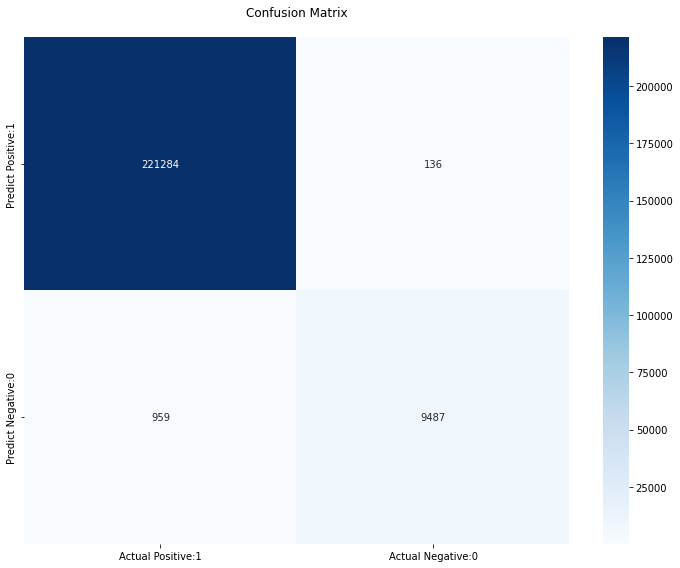

In [37]:
# view the confusion matrix to look at the True Positives (TP), True Negatives (TN), False Positives (FP) and False Negatives (FN) of the model

# Confusion matrix: calculation of Specificity and Sensitivity

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
fig, ax = plt.subplots(figsize=(10,8))
cm = confusion_matrix(y_test, y_pred)
cm_matrix = pd.DataFrame(data=cm, columns=['Actual Positive:1', 'Actual Negative:0'], 
                                 index=['Predict Positive:1', 'Predict Negative:0'])
sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix\n")
plt.tight_layout()

In [38]:
# look at the classification metrics of the LightGBM model

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    221420
           1       0.99      0.91      0.95     10446

    accuracy                           1.00    231866
   macro avg       0.99      0.95      0.97    231866
weighted avg       1.00      1.00      1.00    231866





*   99% of predicted removed records are correctly predicted. A high precision scoring that correctly classifies the correct class.
*   91% of actual removed records are correctly predicted. A relatively high f1-score when classifying loan applications that are not likely to be removed and a moderately high f1-score when classifying loan applications that are likely to be removed.